# Signal Processing for Artificial Intelligence in Audio

______________

### Student 1: Adi Dereviani, 305674731
### Student 2: Ron Dagani, 318170917

_____________

# Speech Emotion Analyzer - Final Project

This project focuses on analyzing speech data to classify emotions using machine learning. It includes dataset preprocessing, feature extraction, and deep learning model training.  

The goal is to develop a voice emotion detector capable of identifying emotions from speech audio.

### Imports

In [ ]:
!pip install resampy

import os
import random
import zipfile
import numpy as np
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix, classification_report
from IPython.display import Audio, display

os.environ['TF_DETERMINISTIC_OPS'] = '1'
tf.config.experimental.enable_op_determinism()

SEED = 44
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

### EXTRACT RAVDESS DATA

Extract the RAVDESS dataset from the zip file and store the audio files in the designated directory.

In [ ]:
zip_path = '/content/Audio_Song_Actors_01-24.zip'
extract_path = '/content/Audio_Song_Actors_01-24'
try:
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
except zipfile.BadZipFile:
    print("Error: The file at", zip_path, "is not a valid zip file. Please check the file or update the file path.")

### BUILD DATAFRAME

Create a DataFrame that maps each audio file to its corresponding emotion and gender, based on the filename conventions in the RAVDESS dataset.

In [ ]:
emotion_map = {
    '01': 'neutral', '02': 'calm', '03': 'happy', '04': 'sad',
    '05': 'angry',  '06': 'fearful'
}
file_list, labels = [], []
for root, dirs, files in os.walk(extract_path):
    for file in sorted(files):
        if file.endswith('.wav'):
            path = os.path.join(root, file)
            file_list.append(path)
            parts = file.split('-')
            if len(parts) >= 7:
                emotion_code = parts[2]
                actor = int(parts[-1].split('.')[0])
                # Use odd/even rule here:
                gender = 'male' if actor % 2 == 1 else 'female'
                labels.append(f"{gender}_{emotion_map.get(emotion_code, 'unknown')}")
            else:
                labels.append('unknown')

meta_df = pd.DataFrame({'Path': file_list, 'Emotion': labels})

In [ ]:
meta_df.head()

,Path,Emotion
0,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral
1,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral
2,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral
3,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral
4,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_calm


In [ ]:
# Create a new 'Gender' column sorted by actor number (odd: Male, even: Female)
def extract_gender_from_path(file_path):
    file_name = os.path.basename(file_path)
    parts = file_name.split('-')
    if len(parts) >= 7:
        return int(parts[-1].split('.')[0])
    return None

meta_df['Actor'] = meta_df['Path'].apply(extract_gender_from_path)
meta_df['Gender'] = meta_df['Actor'].apply(lambda x: 'Male' if x % 2 == 1 else 'Female')

In [ ]:
meta_df.head()

,Path,Emotion,Actor,Gender
0,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral,2,Female
1,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral,2,Female
2,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral,2,Female
3,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_neutral,2,Female
4,/content/Audio_Song_Actors_01-24/Actor_02/03-0...,female_calm,2,Female


### VISUALIZATION

Visualize the distribution of emotions in the dataset using a bar chart, and define functions to generate waveplots and spectrograms, as well as apply data augmentation techniques such as adding noise, stretching, shifting, and pitch shifting.

<ipython-input-31-12fe89a4bfbb>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


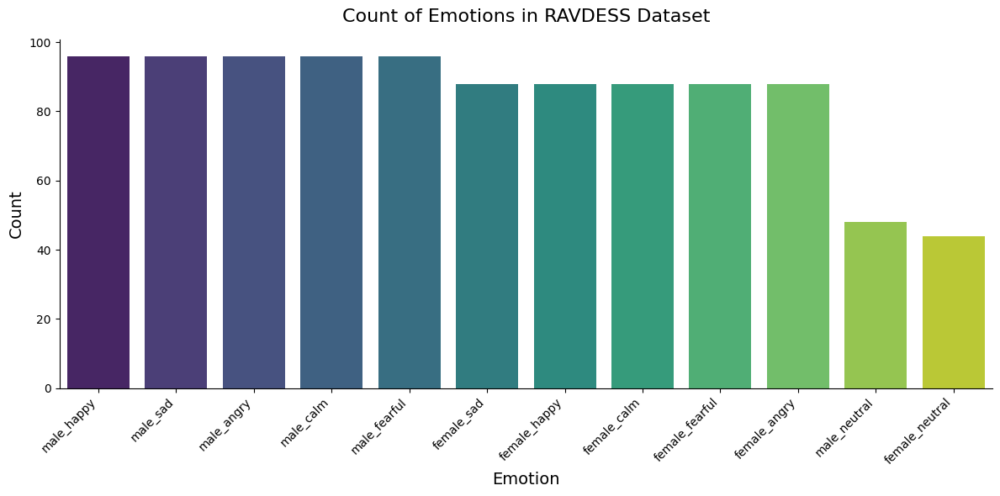

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(
    x='Emotion',
    data=meta_df,
    order=meta_df['Emotion'].value_counts().index,
    palette='viridis'
)
plt.title('Count of Emotions in RAVDESS Dataset', fontsize=16, pad=15)
plt.xlabel('Emotion', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right')
sns.despine(top=True, right=True, left=False, bottom=False)
plt.tight_layout()
plt.show()

def create_waveplot(data, sr, emotion):
    plt.figure(figsize=(10,3))
    plt.title(f'Waveplot for {emotion}', fontsize=15)
    librosa.display.waveshow(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, emotion):
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12,3))
    plt.title(f'Spectrogram for {emotion}', fontsize=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    plt.show()

Selects and plays an audio sample based on gender and emotion, then generates waveplot and spectrogram.


In [ ]:
def play_and_plot(gender, emotion, meta_df):
    sample_files = meta_df[
        (meta_df.Gender == gender) &
        (meta_df.Emotion.str.contains(emotion, case=False))
    ]['Path'].values

    if len(sample_files) > 0:
        example_file = random.choice(sample_files)
        print(f"Selected file for {gender} {emotion}: {example_file}")
        data_sample, sr_sample = librosa.load(example_file, duration=5.0, sr=44100, offset=0.5)
        print(f"Playing example for {gender} {emotion}")
        display(Audio(data_sample, rate=sr_sample))
        create_waveplot(data_sample, sr_sample, f"{gender}_{emotion}")
        create_spectrogram(data_sample, sr_sample, f"{gender}_{emotion}")
    else:
        print(f"No sample found for {gender} with emotion {emotion}")

Selected file for Male neutral: /content/Audio_Song_Actors_01-24/Actor_23/03-02-01-01-02-01-23.wav
Playing example for Male neutral


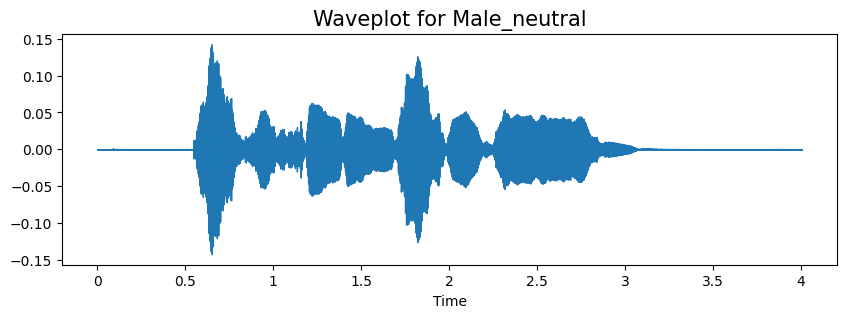

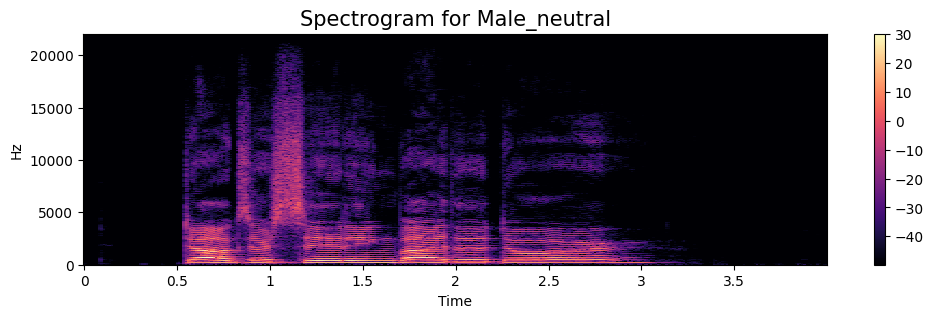

In [ ]:
play_and_plot('Male', 'neutral', meta_df)


Selected file for Female neutral: /content/Audio_Song_Actors_01-24/Actor_20/03-02-01-01-01-02-20.wav
Playing example for Female neutral


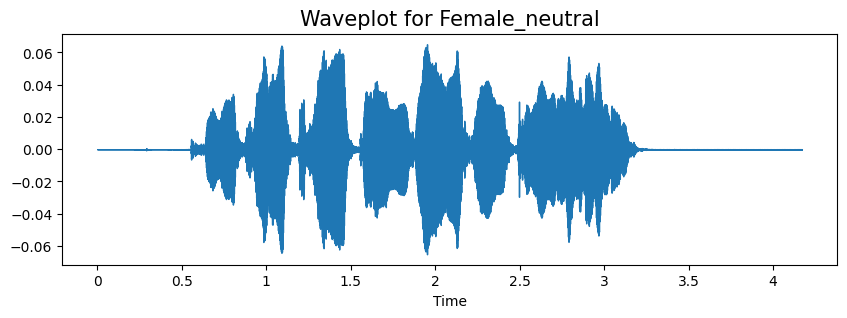

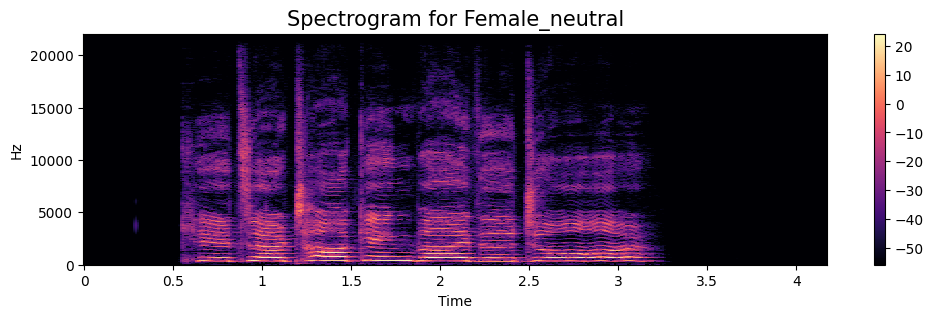

In [ ]:
play_and_plot('Female', 'neutral', meta_df)


Selected file for Male calm: /content/Audio_Song_Actors_01-24/Actor_11/03-02-02-02-01-02-11.wav
Playing example for Male calm


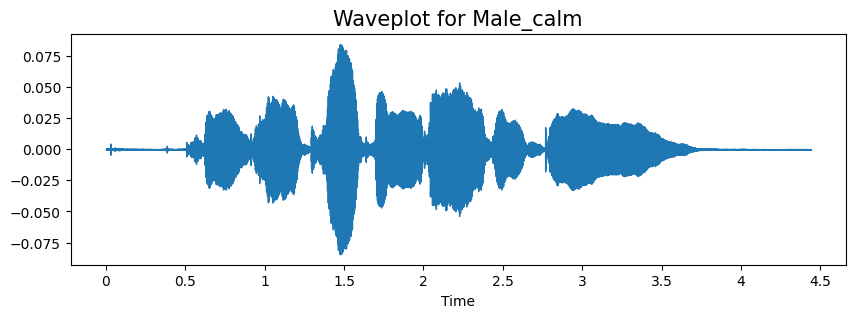

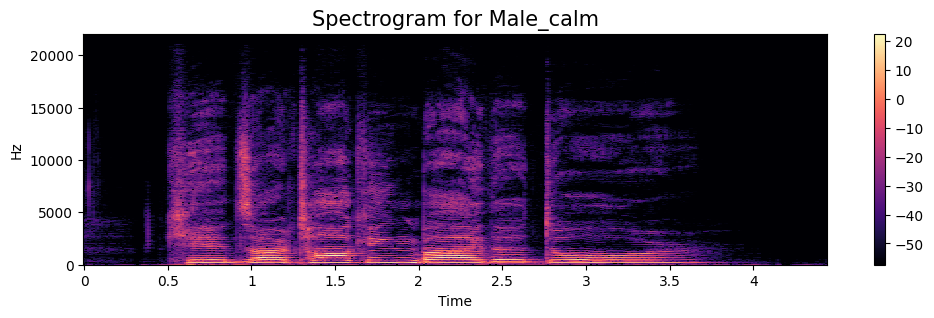

In [ ]:
play_and_plot('Male', 'calm', meta_df)


Selected file for Female calm: /content/Audio_Song_Actors_01-24/Actor_06/03-02-02-02-02-01-06.wav
Playing example for Female calm


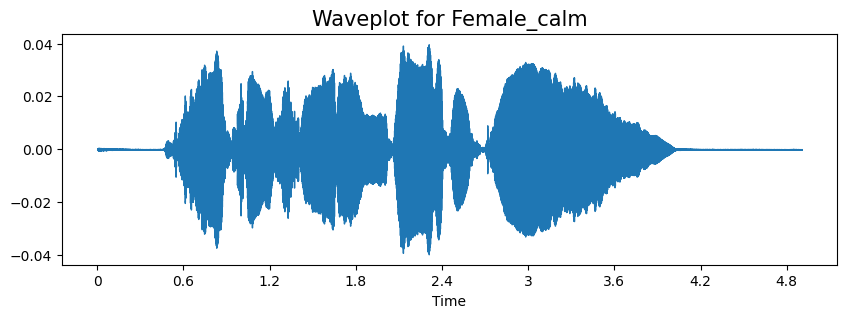

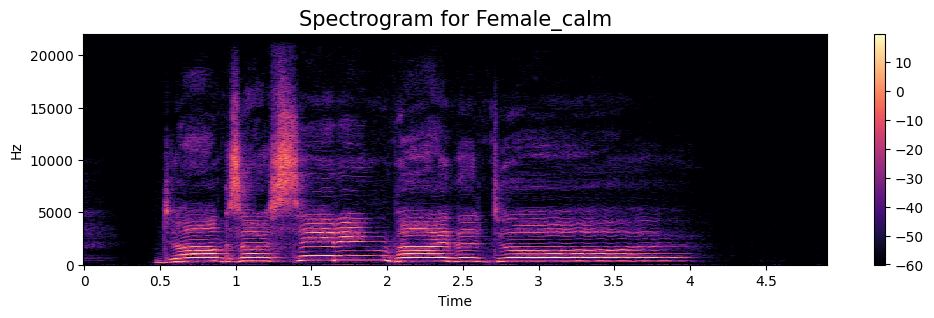

In [ ]:
play_and_plot('Female', 'calm', meta_df)


Selected file for Male happy: /content/Audio_Song_Actors_01-24/Actor_13/03-02-03-02-02-01-13.wav
Playing example for Male happy


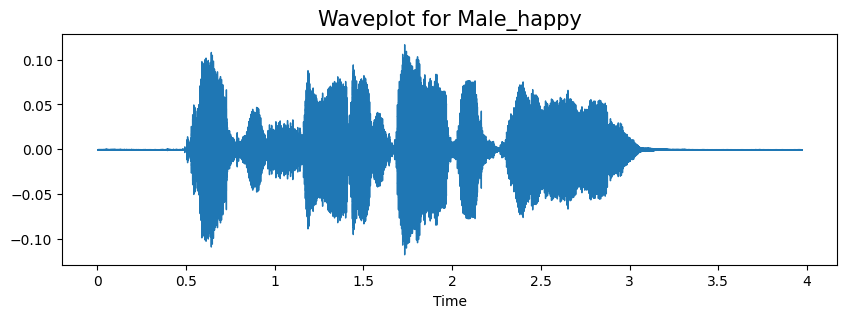

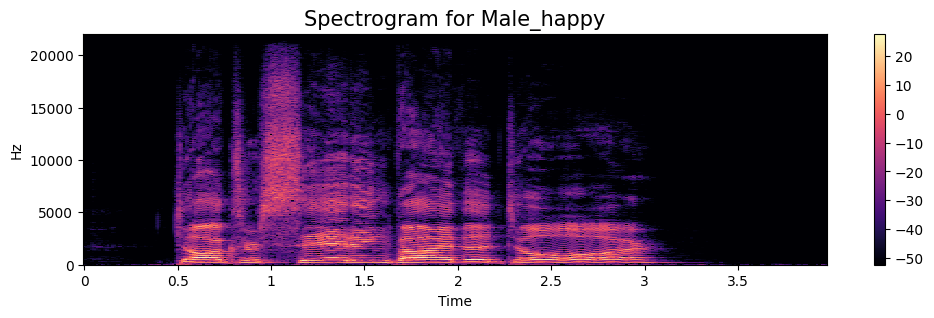

In [ ]:
play_and_plot('Male', 'happy', meta_df)


Selected file for Female happy: /content/Audio_Song_Actors_01-24/Actor_24/03-02-03-01-01-01-24.wav
Playing example for Female happy


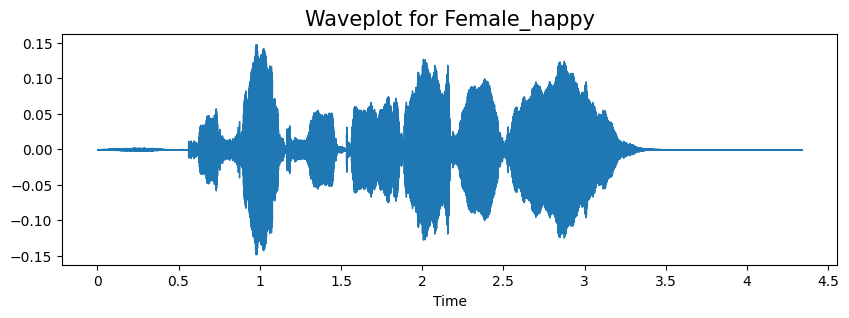

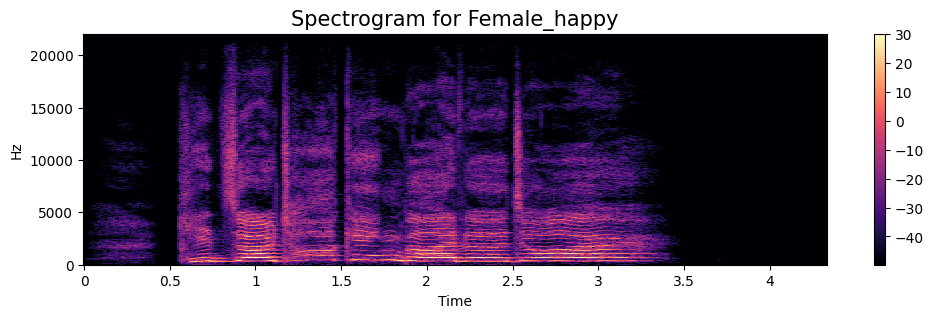

In [ ]:
play_and_plot('Female', 'happy', meta_df)


Selected file for Male sad: /content/Audio_Song_Actors_01-24/Actor_09/03-02-04-02-01-01-09.wav
Playing example for Male sad


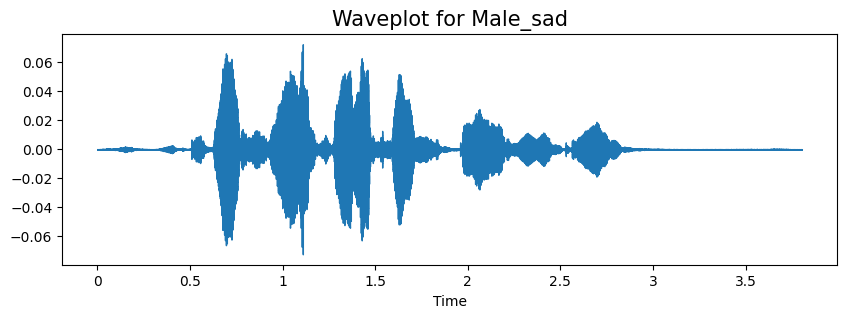

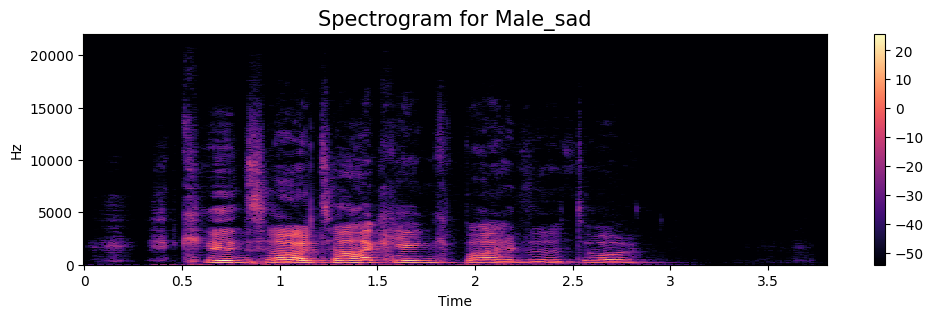

In [ ]:
play_and_plot('Male', 'sad', meta_df)


Selected file for Female sad: /content/Audio_Song_Actors_01-24/Actor_04/03-02-04-02-01-02-04.wav
Playing example for Female sad


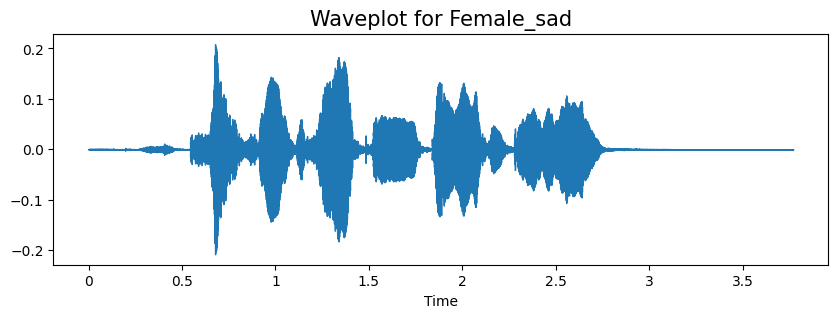

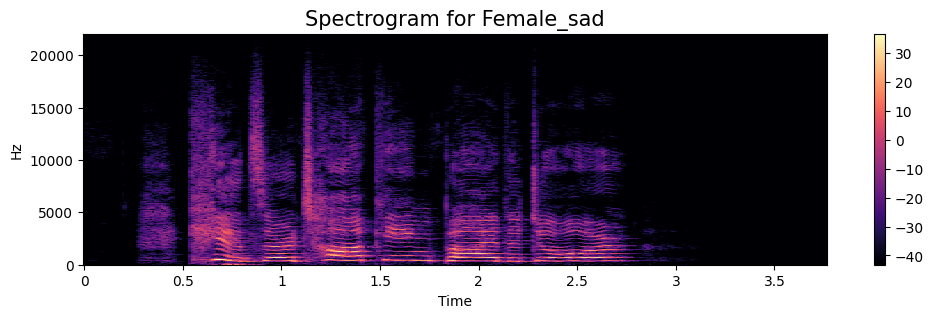

In [ ]:
play_and_plot('Female', 'sad', meta_df)


Selected file for Male angry: /content/Audio_Song_Actors_01-24/Actor_19/03-02-05-01-02-02-19.wav
Playing example for Male angry


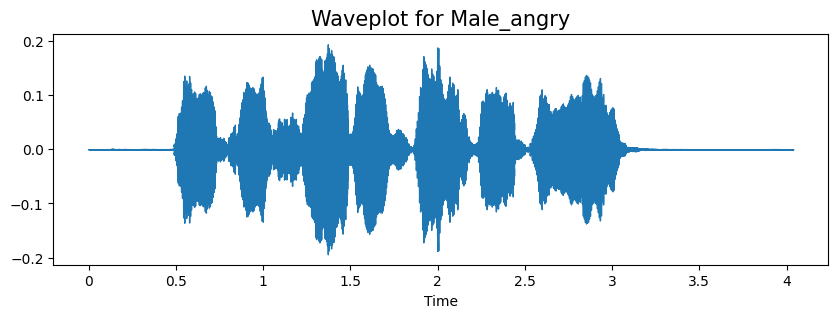

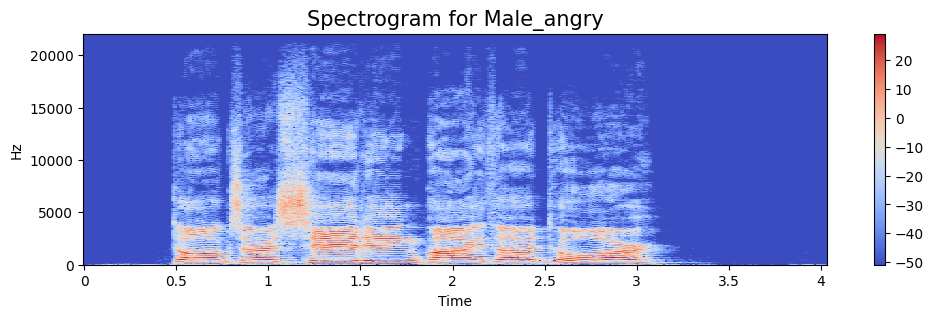

In [ ]:
play_and_plot('Male', 'angry', meta_df)


Selected file for Female angry: /content/Audio_Song_Actors_01-24/Actor_08/03-02-05-02-01-01-08.wav
Playing example for Female angry


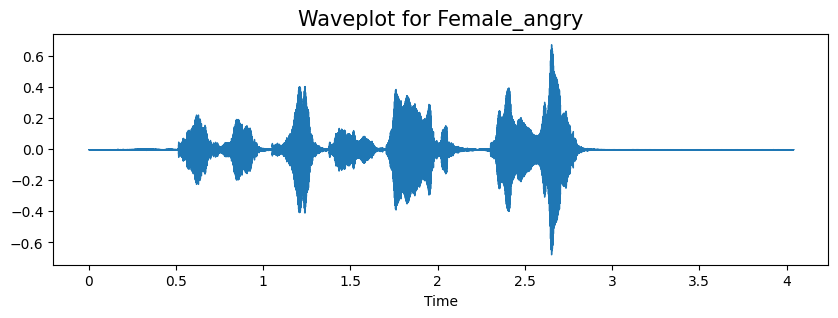

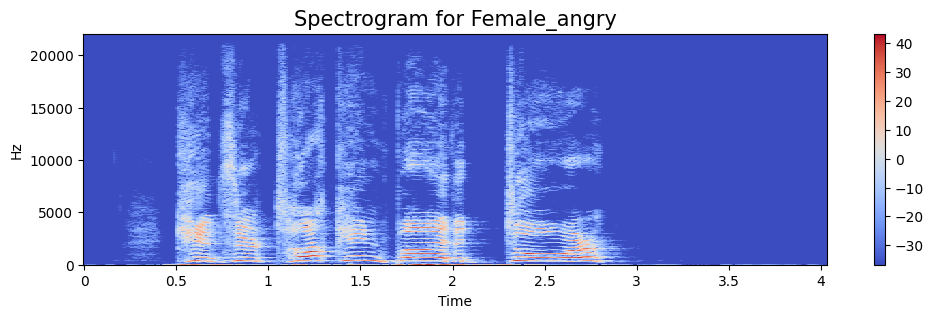

In [ ]:
play_and_plot('Female', 'angry', meta_df)


Selected file for Male fearful: /content/Audio_Song_Actors_01-24/Actor_21/03-02-06-02-02-01-21.wav
Playing example for Male fearful


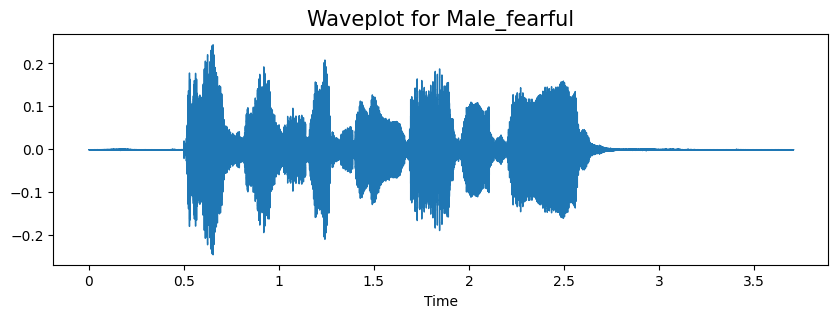

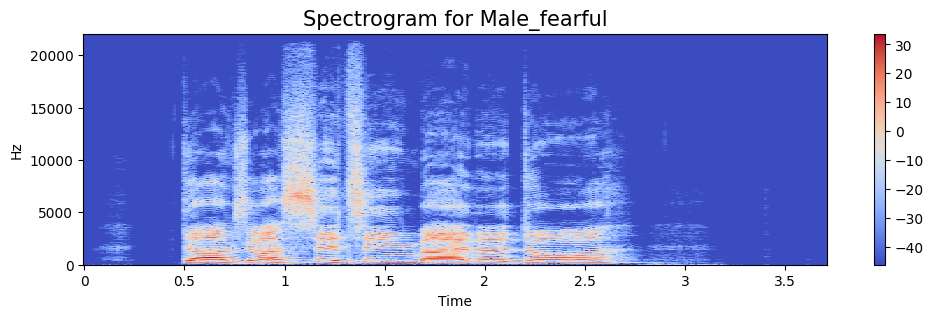

In [ ]:
play_and_plot('Male', 'fearful', meta_df)

Selected file for Female fearful: /content/Audio_Song_Actors_01-24/Actor_12/03-02-06-01-01-01-12.wav
Playing example for Female fearful


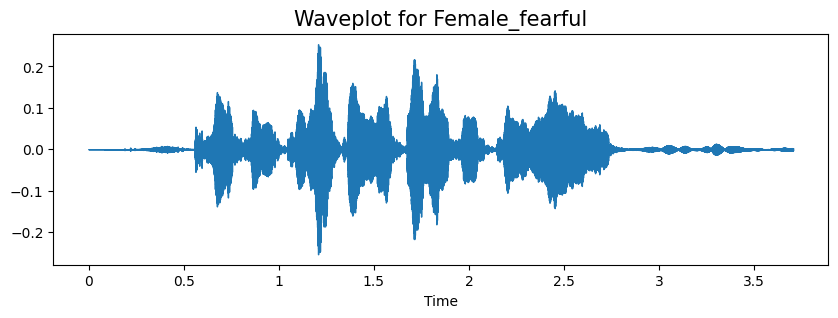

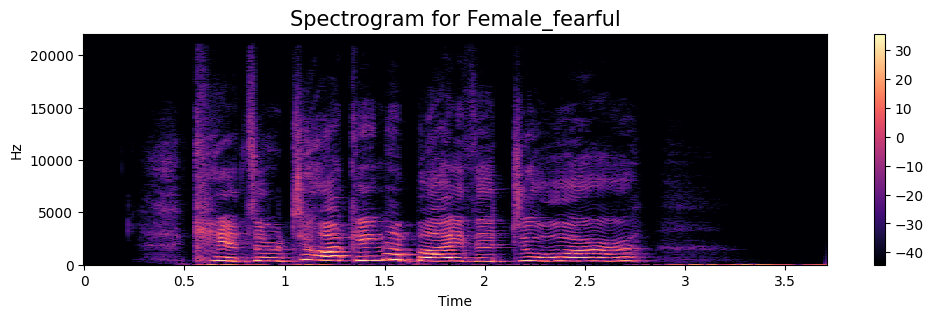

In [ ]:
play_and_plot('Female', 'fearful', meta_df)

### DATA AUGMENTATION

Define data augmentation functions to modify audio data.

These include adding noise, time stretching, shifting, and pitch shifting.

In [ ]:
def add_noise(data):
    noise_amp = 0.05 * np.random.uniform() * np.amax(data)
    return data + noise_amp * np.random.normal(size=data.shape[0])

def stretch(data, rate=None):
    if rate is None:
        rate = np.random.uniform(0.8, 1.2)
    return librosa.effects.time_stretch(data, rate=rate)

def shift(data):
    shift_range = int(np.random.uniform(-5, 5) * 1000)
    return np.roll(data, shift_range)

def pitch_shift(data, sr, pitch_factor=None):
    if pitch_factor is None:
        pitch_factor = np.random.uniform(-3, 3)
    return librosa.effects.pitch_shift(y=data, sr=sr, n_steps=pitch_factor)

### Demonstration of Data Augmentation on a Sample File

Original Audio:


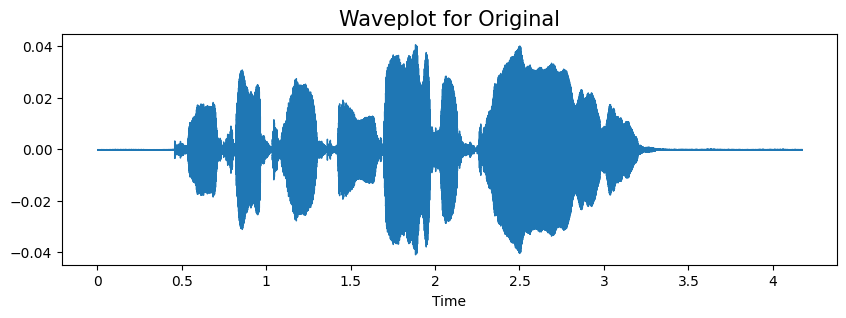

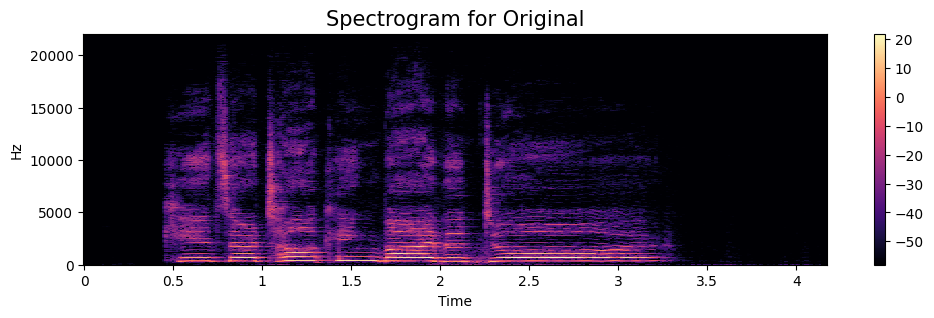

Audio with Noise Added:


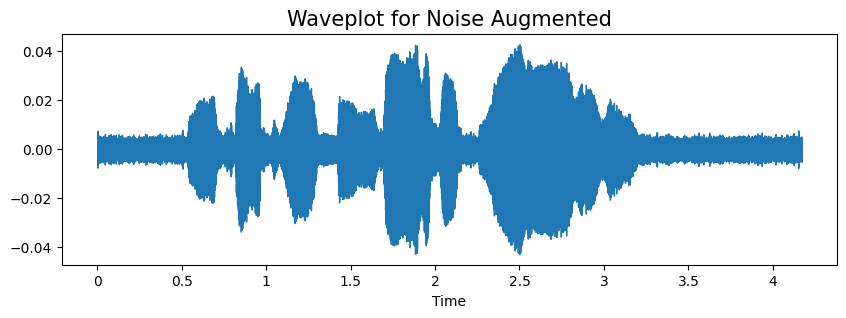

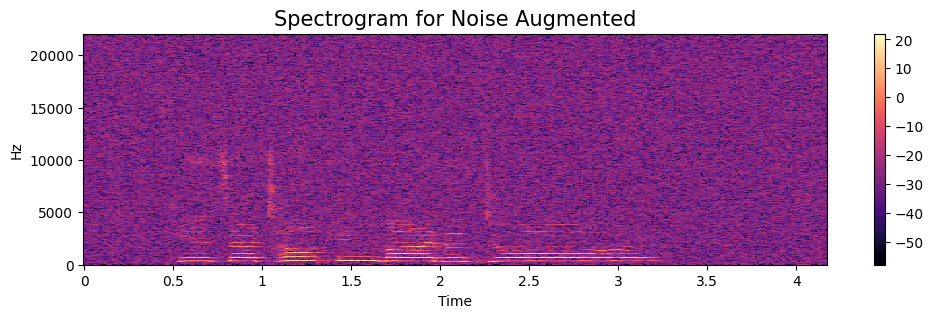

Audio with Time Stretch:


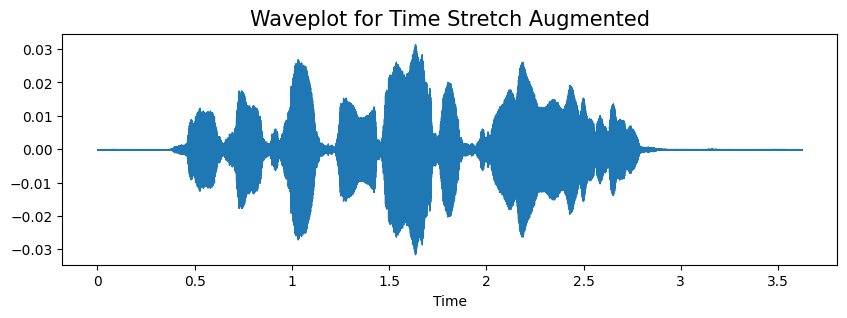

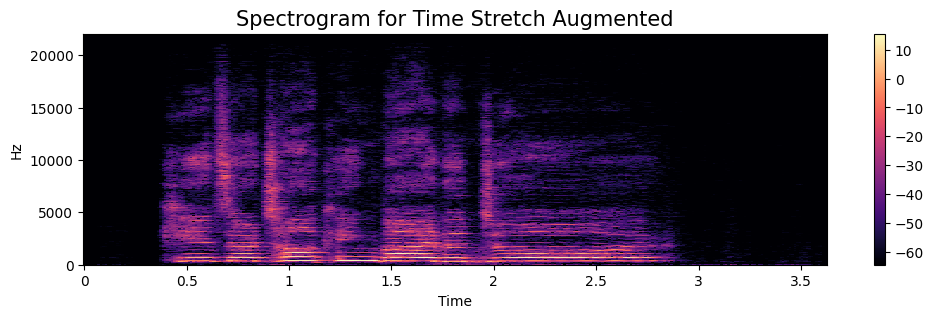

Audio with Shift:


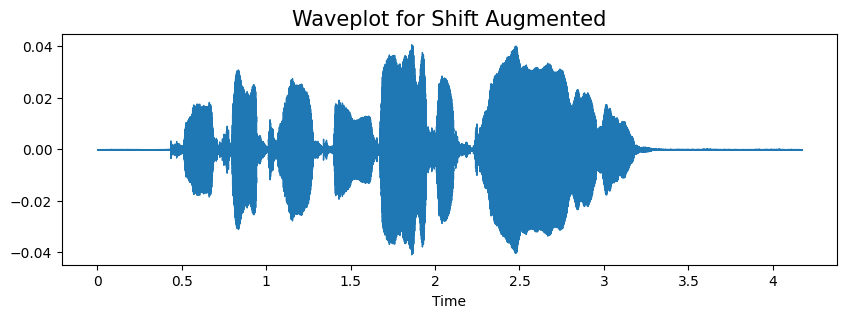

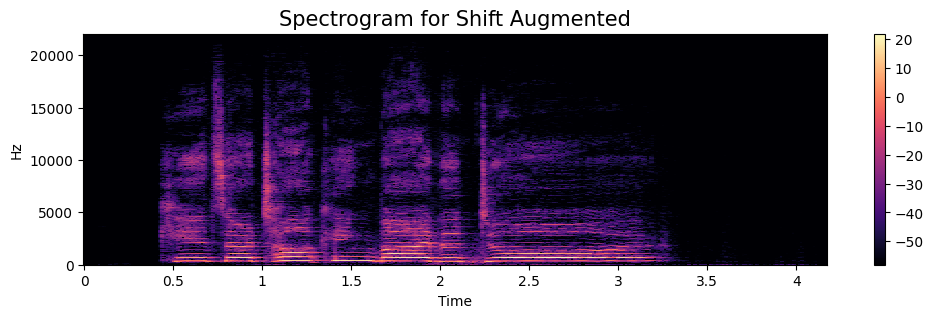

Audio with Pitch Shift:


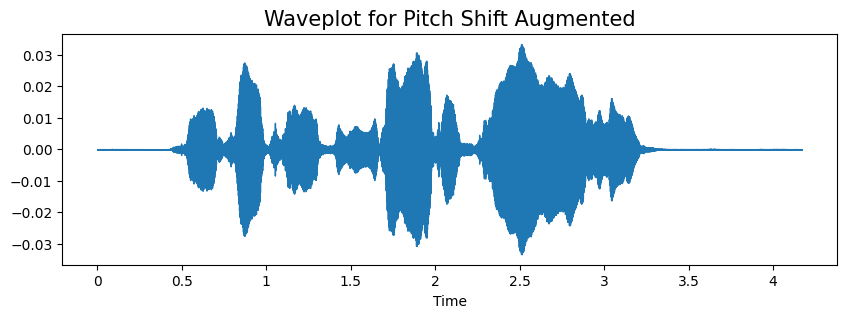

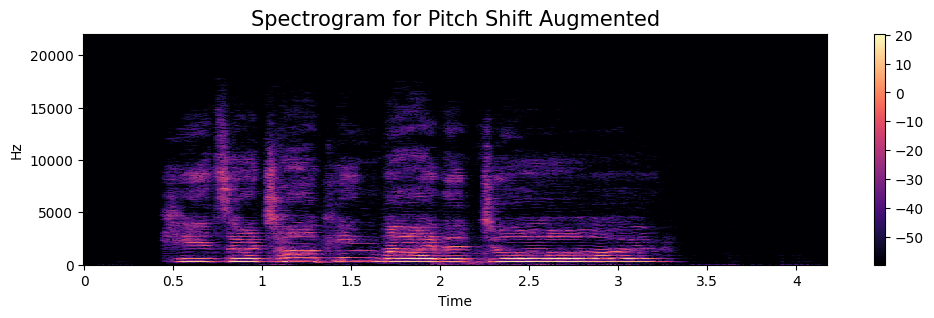

In [ ]:
example_file = meta_df.iloc[0]['Path']
data, sr = librosa.load(example_file, sr=44100, duration=5.0, offset=0.5)

print("Original Audio:")
display(Audio(data, rate=sr))
create_waveplot(data, sr, "Original")
create_spectrogram(data, sr, "Original")

# 1. Add Noise
data_noise = add_noise(data)
print("Audio with Noise Added:")
display(Audio(data_noise, rate=sr))
create_waveplot(data_noise, sr, "Noise Augmented")
create_spectrogram(data_noise, sr, "Noise Augmented")

# 2. Time Stretch
data_stretch = stretch(data)
print("Audio with Time Stretch:")
display(Audio(data_stretch, rate=sr))
create_waveplot(data_stretch, sr, "Time Stretch Augmented")
create_spectrogram(data_stretch, sr, "Time Stretch Augmented")

# 3. Shift
data_shift = shift(data)
print("Audio with Shift:")
display(Audio(data_shift, rate=sr))
create_waveplot(data_shift, sr, "Shift Augmented")
create_spectrogram(data_shift, sr, "Shift Augmented")

# 4. Pitch Shift
data_pitch = pitch_shift(data, sr)
print("Audio with Pitch Shift:")
display(Audio(data_pitch, rate=sr))
create_waveplot(data_pitch, sr, "Pitch Shift Augmented")
create_spectrogram(data_pitch, sr, "Pitch Shift Augmented")

### EXTRACT 2D LOG-MEL SPECTROGRAM

Define a function to convert an audio signal into a 2D log-mel spectrogram.

Also, define a helper function to process an audio file with multiple augmentations.

In [ ]:
def extract_logmel_spectrogram(data, sr, n_mels=128, n_frames=128):
    mel = librosa.feature.melspectrogram(y=data, sr=sr, n_mels=n_mels)
    logmel = librosa.power_to_db(mel, ref=np.max)
    if logmel.shape[1] < n_frames:
        pad_width = n_frames - logmel.shape[1]
        logmel = np.pad(logmel, ((0,0),(0,pad_width)), mode='constant')
    else:
        logmel = logmel[:, :n_frames]
    return logmel

def process_audio_file(file_path, sr=44100, duration=2.5, offset=0.5):
    # Original audio load
    y, sr = librosa.load(file_path, sr=sr, duration=duration, offset=offset)
    spectro_list = []

    # 1) Original
    spectro_list.append(extract_logmel_spectrogram(y, sr))

    # 2) Noise augmentation
    y_noise = add_noise(y)
    spectro_list.append(extract_logmel_spectrogram(y_noise, sr))

    # 3) Stretch + Pitch augmentation
    y_stretch = stretch(y)
    y_stretch_pitch = pitch_shift(y_stretch, sr)
    spectro_list.append(extract_logmel_spectrogram(y_stretch_pitch, sr))

    return spectro_list

## TRAIN/TEST SPLITS

Split the dataset into training and testing sets with stratification to maintain class balance.

In [ ]:
from sklearn.model_selection import train_test_split

meta_df = shuffle(meta_df, random_state=SEED).reset_index(drop=True)
train_files, test_files = train_test_split(meta_df, test_size=0.2, random_state=SEED, stratify=meta_df['Emotion'])

### BUILD DATASET (2D SPECTROGRAMS) WITH AUGMENTATION

Build the training and testing datasets by processing each audio file into log-mel spectrograms.

Apply data augmentation to the training data.

In [ ]:
X_train, Y_train = [], []
for _, row in train_files.iterrows():
    path = row['Path']
    emotion = row['Emotion']
    specs = process_audio_file(path)
    for s in specs:
        X_train.append(s)
        Y_train.append(emotion)

X_test, Y_test = [], []
for _, row in test_files.iterrows():
    path = row['Path']
    emotion = row['Emotion']
    y, sr = librosa.load(path, sr=44100, duration=2.5, offset=0.5)
    X_test.append(extract_logmel_spectrogram(y, sr))
    Y_test.append(emotion)

X_train = np.array(X_train)
X_test = np.array(X_test)
print("Train data shape:", X_train.shape, "Test data shape:", X_test.shape)

X_train = np.expand_dims(X_train, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

lb = LabelEncoder()
y_train_enc = lb.fit_transform(Y_train)
y_test_enc = lb.transform(Y_test)

y_train_ohe = to_categorical(y_train_enc)
y_test_ohe = to_categorical(y_test_enc)

num_classes = len(lb.classes_)

Train data shape: (2427, 128, 128) Test data shape: (203, 128, 128)


### BUILD 2D CNN

Define a convolutional neural network (CNN) architecture for speech emotion classification.

In [ ]:
model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(128, 128, 1)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.3),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

rlrp = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7, verbose=1)
history = model.fit(
    X_train, y_train_ohe,
    epochs=20,
    batch_size=32,
    validation_data=(X_test, y_test_ohe),
    callbacks=[rlrp],
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │           1,548 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,612 (12.61 MB)

 Trainable params: 3,305,612 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
76/76 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - accuracy: 0.0850 - loss: 10.3983 - val_accuracy: 0.2562 - val_loss: 2.2891 - learning_rate: 0.0010
Epoch 2/20
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.2361 - loss: 2.0407 - val_accuracy: 0.3990 - val_loss: 1.5601 - learning_rate: 0.0010
Epoch 3/20
76/76 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.3308 - loss: 1.7409 - val_accuracy: 0.5419 - val_loss: 1.2434 - learning_rate: 0.0010
Epoch 4/20
76/76 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.4191 - loss: 1.5008 - val_accuracy: 0.5517 - val_loss: 1.2419 - learning_rate: 0.0010
Epoch 5/20
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.4697 - loss: 1.3962 - val_accuracy: 0.6158 - val_loss: 1.0651 - learning_rate: 0.0010
Epoch 6/20
76/76 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.4944 - loss: 1.2810 - val_accuracy: 0.6404 - val_loss: 0.9489 - learning_rate: 0.0010
Epoch 7/20
76/76 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.5351 - loss: 1.2308 - val_ac

### PLOT TRAINING CURVES

Plot training curves for accuracy and loss to visualize model performance over epochs.

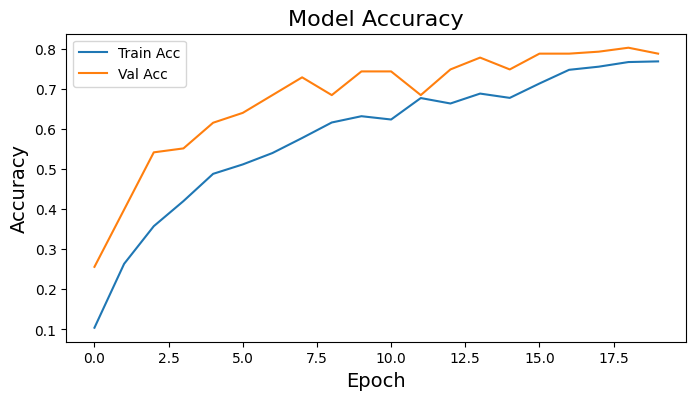

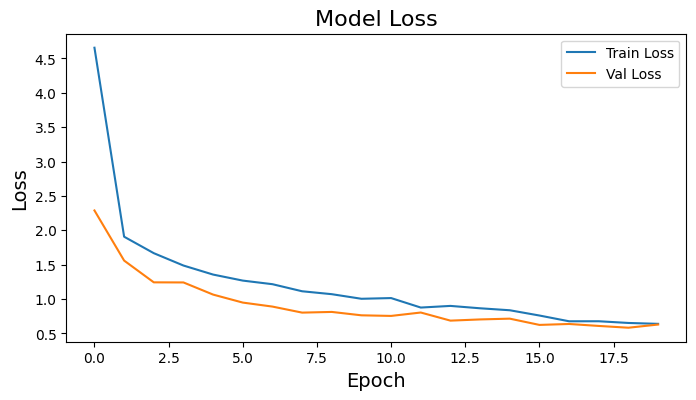

In [ ]:
plt.figure(figsize=(8,4))
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Model Accuracy', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend()
plt.show()

plt.figure(figsize=(8,4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend()
plt.show()

### EVALUATION

Evaluate the model on the test set by predicting labels, computing the confusion matrix, and printing the classification report.

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


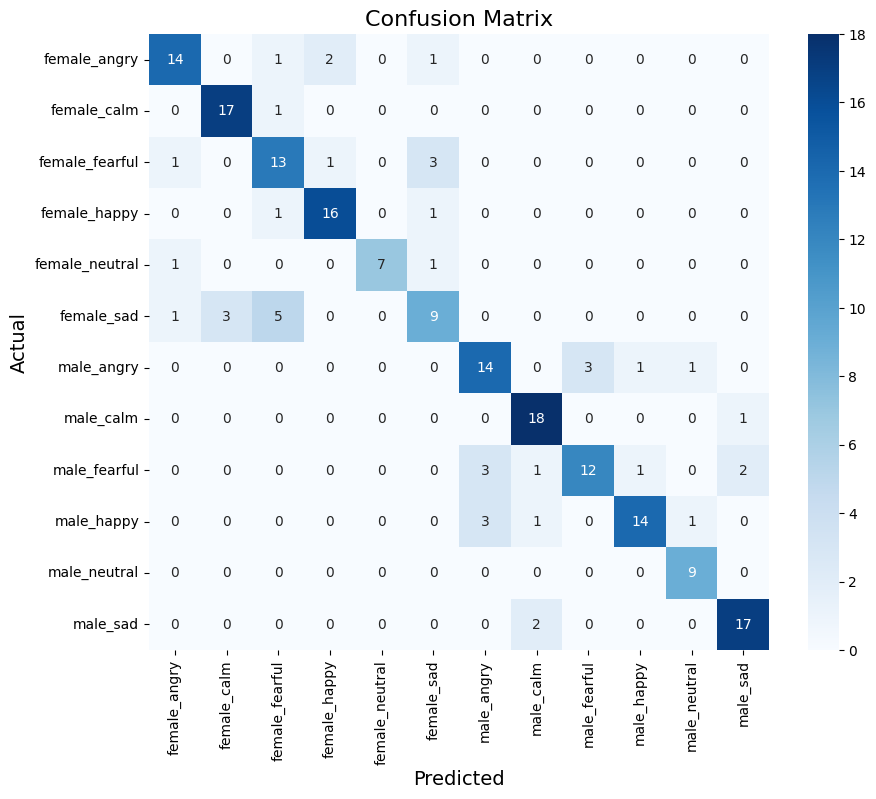


Classification Report:

                precision    recall  f1-score   support

  female_angry     0.8235    0.7778    0.8000        18
   female_calm     0.8500    0.9444    0.8947        18
female_fearful     0.6190    0.7222    0.6667        18
  female_happy     0.8421    0.8889    0.8649        18
female_neutral     1.0000    0.7778    0.8750         9
    female_sad     0.6000    0.5000    0.5455        18
    male_angry     0.7000    0.7368    0.7179        19
     male_calm     0.8182    0.9474    0.8780        19
  male_fearful     0.8000    0.6316    0.7059        19
    male_happy     0.8750    0.7368    0.8000        19
  male_neutral     0.8182    1.0000    0.9000         9
      male_sad     0.8500    0.8947    0.8718        19

      accuracy                         0.7882       203
     macro avg     0.7997    0.7965    0.7934       203
  weighted avg     0.7902    0.7882    0.7851       203



In [ ]:
preds = model.predict(X_test)
pred_labels_enc = np.argmax(preds, axis=1)
pred_labels = lb.inverse_transform(pred_labels_enc)
true_labels = lb.inverse_transform(y_test_enc)

cm = confusion_matrix(true_labels, pred_labels)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=lb.classes_,
            yticklabels=lb.classes_)
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('Actual', fontsize=14)
plt.show()

print("\nClassification Report:\n")
print(classification_report(true_labels, pred_labels, digits=4))

### Actual Values vs. Predicted Values

We will displays the first few rows of the DataFrame, showing a side-by-side comparison of the actual and predicted emotion labels.

In [ ]:
# Create a copy of the test set from meta_df
results_df = test_files.copy()

results_df.rename(columns={'Emotion': 'Actual'}, inplace=True)
results_df['Predicted'] = pred_labels

# Display the actual vs. predicted values
results_df[['Actual', 'Predicted']].head(10)

,Actual,Predicted
148,male_calm,male_calm
623,female_sad,female_angry
842,male_happy,male_happy
205,female_angry,female_angry
499,male_angry,male_happy
429,male_sad,male_sad
32,female_neutral,female_sad
278,male_happy,male_happy
216,female_calm,female_calm
7,female_angry,female_angry
